## Step 1: Load the dataset

In [5]:
import os
import librosa
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, plot_confusion_matrix
import matplotlib.pyplot as plt

data_dir = './data/genres_original'  # Path to dataset directory
genres = os.listdir(data_dir)  # List of genre names

dataset = []  # List to store MFCCs and genre labels
for genre in genres:
    genre_dir = os.path.join(data_dir, genre)  # Path to genre directory
    for filename in os.listdir(genre_dir):
        songname = os.path.join(genre_dir, filename)  # Path to song file
        try:
            y, sr = librosa.load(songname, duration=30)  # Load audio file with duration of 30 seconds
            mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)  # Extract MFCCs
            dataset.append((mfcc, genre))  # Append MFCCs and genre label to dataset list
        except:
            print(f'Error loading {songname}. Skipping...')
            continue

/Users/drewwhite/Desktop/Programming/Projects/musical_journeys/venv/lib/python3.7/site-packages/ipykernel_launcher.py:20: UserWarning: PySoundFile failed. Trying audioread instead.
/Users/drewwhite/Desktop/Programming/Projects/musical_journeys/venv/lib/python3.7/site-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


Error loading ./data/genres_original/jazz/jazz.00054.wav. Skipping...


## Step 2: Split the dataset into training and testing sets

In [6]:
X, y = zip(*dataset)  # Unzip the MFCCs and genre labels
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)  # Split into train and test sets

## Step 3: Reshape and scale the input features

In [7]:
# Find the maximum number of frames in the dataset
max_frames = max([x.shape[1] for x in X_train + X_test])

# Pad or truncate the MFCCs to have the same number of frames
X_train = np.array([np.pad(x, ((0, 0), (0, max_frames - x.shape[1])), mode='constant') for x in X_train])
X_test = np.array([np.pad(x, ((0, 0), (0, max_frames - x.shape[1])), mode='constant') for x in X_test])

# Standardize the input features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train.reshape(len(X_train), -1)).reshape(X_train.shape)
X_test = scaler.transform(X_test.reshape(len(X_test), -1)).reshape(X_test.shape)


## Step 4: Train and evaluate the model

In [8]:
X_train_flat = np.reshape(X_train, (X_train.shape[0], -1))
X_test_flat = np.reshape(X_test, (X_test.shape[0], -1))

model = RandomForestClassifier(n_estimators=100, random_state=42)  # Initialize Random Forest model
model.fit(X_train_flat, y_train) # Train on train set
y_pred = model.predict(X_test_flat)  # Predict on test set
accuracy = accuracy_score(y_test, y_pred)  # Calculate accuracy score
print(f'Accuracy: {accuracy:.2f}')  # Print accuracy score

Accuracy: 0.52


## Step 5: Visualize the confusion matrix

/Users/drewwhite/Desktop/Programming/Projects/musical_journeys/venv/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


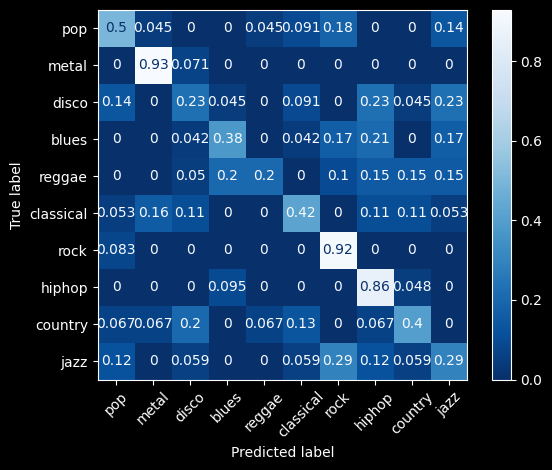

In [9]:
plt.style.use('dark_background')
plot_confusion_matrix(model, X_test_flat, y_test, display_labels=genres, cmap=plt.cm.Blues_r, normalize='true', xticks_rotation=45)
plt.show()  # Show confusion matrix

## Recommendation System

In [10]:
import IPython.display as ipd
from sklearn.metrics.pairwise import cosine_similarity
from sklearn import preprocessing

# Read features_30_sec
file_path = './data'
df = pd.read_csv(f'{file_path}/features_30_sec.csv', index_col='filename')

# Pull labels
labels = df[['label']]

# Drop labels from df
df = df.drop(columns=['length', 'label'])
df.head()

# Scale df
df_scaled = preprocessing.scale(df)
print('Scaled data:', type(df_scaled))

Scaled data: <class 'numpy.ndarray'>


## Cosine Similarity

In [11]:
# Cosine similarity
similarity = cosine_similarity(df_scaled)
print("Similarity shape:", similarity.shape)

# Convert into a dataframe and then set the row index and column names as labels
sim_df_labels = pd.DataFrame(similarity)
sim_df_names = sim_df_labels.set_index(labels.index)
sim_df_names.columns = labels.index

sim_df_names.head()

Similarity shape: (1000, 1000)


filename,blues.00000.wav,blues.00001.wav,blues.00002.wav,blues.00003.wav,blues.00004.wav,blues.00005.wav,blues.00006.wav,blues.00007.wav,blues.00008.wav,blues.00009.wav,...,rock.00090.wav,rock.00091.wav,rock.00092.wav,rock.00093.wav,rock.00094.wav,rock.00095.wav,rock.00096.wav,rock.00097.wav,rock.00098.wav,rock.00099.wav
filename,,,,,,,,,,,,,,,,,,,,,
blues.00000.wav,1.000000,0.049231,0.589618,0.284862,0.025561,-0.346688,-0.219483,-0.167626,0.641877,-0.097889,...,-0.082829,0.546169,0.578558,0.662590,0.571629,0.610942,0.640835,0.496294,0.284958,0.304098
blues.00001.wav,0.049231,1.000000,-0.096834,0.520903,0.080749,0.307856,0.318286,0.415258,0.120649,0.404168,...,-0.098111,-0.325126,-0.370792,-0.191698,-0.330834,-0.077301,-0.222119,-0.302573,0.499562,0.311723
blues.00002.wav,0.589618,-0.096834,1.000000,0.210411,0.400266,-0.082019,-0.028061,0.104446,0.468113,-0.132532,...,-0.032408,0.561074,0.590779,0.583293,0.514537,0.495707,0.566837,0.589983,0.216378,0.321069
blues.00003.wav,0.284862,0.520903,0.210411,1.000000,0.126437,0.134796,0.300746,0.324566,0.352758,0.295184,...,-0.320107,-0.206516,-0.151132,0.041986,-0.172515,-0.000287,0.020515,-0.107821,0.502279,0.183210
blues.00004.wav,0.025561,0.080749,0.400266,0.126437,1.000000,0.556066,0.482195,0.623455,0.029703,0.471657,...,0.087605,0.017366,0.138035,0.104684,-0.034594,0.063454,0.063546,0.172944,0.153192,0.061785


## Song Recommendation Function

In [12]:
ipd.Audio(f'{file_path}/genres_original/metal/metal.00015.wav')


Dark Tranquility - Nightfall by the Shore of Time

In [13]:
import librosa

def song_recommendation(name):

    # get genre name from first part of the file name
    genre = name.split('.')[0]
    # map genre name to directory name
    genre_dir_map = {
        'blues': 'blues',
        'classical': 'classical',
        'country': 'country',
        'disco': 'disco',
        'hiphop': 'hiphop',
        'jazz': 'jazz',
        'metal': 'metal',
        'pop': 'pop',
        'reggae': 'reggae',
        'rock': 'rock'
    }
    genre_dir = genre_dir_map.get(genre, None)
    if genre_dir is None:
        print(f"Unknown genre for file {name}")
        return

    # Find songs most similar to another song
    series = sim_df_names[name].sort_values(ascending = False)

    # Remove cosine similarity == 1 (songs will always have the best match with themselves)
    series = series.drop(name)

    # Display the 5 top matches
    print("\n*******\nSimilar songs to ", name)
    for filename, score in series.head(8).iteritems():
        print(f'{filename} ({score:.2f})')
        genre = filename.split('.')[0]
        genre_dir = genre_dir_map.get(genre, None)
        if genre_dir is None:
            print(f"Unknown genre for file {filename}")
            continue
        filepath = f'{file_path}/genres_original/{genre_dir}/{filename}'
        y, sr = librosa.load(filepath, sr=None)
        ipd.display(ipd.Audio(y, rate=sr))

song_recommendation('metal.00015.wav')


*******
Similar songs to  metal.00015.wav
metal.00010.wav (0.98)


metal.00036.wav (0.92)


metal.00093.wav (0.89)


metal.00011.wav (0.88)


metal.00012.wav (0.88)


metal.00014.wav (0.88)


metal.00029.wav (0.88)


disco.00073.wav (0.88)


In [18]:
import librosa
from pydub import AudioSegment
from pydub.playback import play
import IPython.display as ipd

def song_recommendation(name):

    # get genre name from first two characters of the file name
    genre = name.split('.')[0]
    # map genre name to directory name
    genre_dir_map = {
        'blues': 'blues',
        'classical': 'classical',
        'country': 'country',
        'disco': 'disco',
        'hiphop': 'hiphop',
        'jazz': 'jazz',
        'metal': 'metal',
        'pop': 'pop',
        'reggae': 'reggae',
        'rock': 'rock'
    }
    genre_dir = genre_dir_map.get(genre, None)
    if genre_dir is None:
        print(f"Unknown genre for file {name}")
        return

    # Find songs most similar to another song
    series = sim_df_names[name].sort_values(ascending = False)

    # Remove cosine similarity == 1 (songs will always have the best match with themselves)
    series = series.drop(name)

    # Display the 5 top matches
    print("\n*******\nSimilar songs to ", name)
    for filename, score in series.head(5).iteritems():
        print(f'{filename} ({score:.2f})')
        filepath = f'{file_path}/genres_original/{genre_dir}/{filename}'

        # Load audio file using Pydub
        audio = AudioSegment.from_file(filepath)

        # Extract artist and title from filename
        if '-' in filename:
            artist, title = filename.split('.')[0].split('-')
            print(f'Artist: {artist} \nTitle: {title}')

            # Display audio using IPython display
            ipd.display(ipd.Audio(audio.raw_data, rate=audio.frame_rate))
        else:
            print('Could not extract artist and title from filename')

song_recommendation('metal.00015.wav')


*******
Similar songs to  metal.00015.wav
metal.00010.wav (0.98)
Could not extract artist and title from filename
metal.00036.wav (0.92)
Could not extract artist and title from filename
metal.00093.wav (0.89)
Could not extract artist and title from filename
metal.00011.wav (0.88)
Could not extract artist and title from filename
metal.00012.wav (0.88)
Could not extract artist and title from filename


## WIP - Songs do not have info, want to pull artist and title

In [17]:
# from ShazamAPI import Shazam

# mp3_file_content_to_recognize = open('./data/genres_original/metal/metal.00015.wav', 'rb').read()

# shazam = Shazam(mp3_file_content_to_recognize)
# recognize_generator = shazam.recognizeSong()
# while True:
# 	print(next(recognize_generator)) # current offset & shazam response to recognize requests

## Spotify

In [18]:

markets = ['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT', 'AU', 'AZ', 'BA', 'BB', 'BD', 'BE', 'BF', 'BG', 'BH', 'BI', 'BJ', 'BM', 'BN', 'BO', 'BR', 'BS', 'BT', 'BW', 'BY', 'BZ', 'CA', 'CD', 'CG', 'CH', 'CI', 'CL', 'CM', 'CN', 'CO', 'CR', 'CV', 'CY', 'CZ', 'DE', 'DJ', 'DK', 'DM', 'DO', 'DZ', 'EC', 'EE', 'EG', 'ES', 'ET', 'FI', 'FJ', 'FM', 'FR', 'GA', 'GB', 'GD', 'GE', 'GH', 'GM', 'GN', 'GQ', 'GR', 'GT', 'GW', 'GY', 'HK', 'HN', 'HR', 'HT', 'HU', 'ID', 'IE', 'IL', 'IN', 'IQ', 'IS', 'IT', 'JM', 'JO', 'JP', 'KE', 'KG', 'KH', 'KI', 'KM', 'KN', 'KP', 'KR', 'KW', 'KZ', 'LA', 'LB', 'LC', 'LI', 'LK', 'LR', 'LS', 'LT', 'LU', 'LV', 'LY', 'MA', 'MC', 'MD', 'ME', 'MG', 'MH', 'MK', 'ML', 'MM', 'MN', 'MR', 'MT', 'MU', 'MV', 'MW', 'MX', 'MY', 'MZ', 'NA', 'NE', 'NG', 'NI', 'NL', 'NO', 'NP', 'NR', 'NZ', 'OM', 'PA', 'PE', 'PG', 'PH', 'PK', 'PL', 'PT', 'PW', 'PY', 'QA', 'RO', 'RS', 'RU', 'RW', 'SA', 'SB', 'SC', 'SD', 'SE', 'SG', 'SI', 'SK', 'SL', 'SM', 'SN', 'SO', 'SR', 'ST', 'SV', 'SY', 'SZ', 'TD', 'TG', 'TH', 'TJ', 'TL', 'TM', 'TN', 'TO', 'TR', 'TT', 'TV', 'TW', 'TZ', 'UA', 'UG', 'US', 'UY', 'UZ', 'VC', 'VE', 'VN', 'VU', 'WS', 'XK', 'YE', 'ZA', 'ZM', 'ZW']


## API

In [41]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
import os

client_id = os.environ['SPOTIPY_CLIENT_ID']
client_secret = os.environ['SPOTIPY_CLIENT_SECRET']

client_credentials_manager = SpotifyClientCredentials(
    client_id=client_id,
    client_secret=client_secret
)

sp = spotipy.Spotify(
    client_credentials_manager=client_credentials_manager
)


## Messing with Market Data to extract popularity

In [52]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
import os

client_id = os.environ['SPOTIPY_CLIENT_ID']
client_secret = os.environ['SPOTIPY_CLIENT_SECRET']
client_credentials_manager = SpotifyClientCredentials(client_id=client_id, client_secret=client_secret)
sp = spotipy.Spotify(client_credentials_manager=client_credentials_manager)

# Get list of metal playlists
categories = sp.categories(limit=1)
category_id = categories['categories']['items'][0]['id']

playlists = sp.category_playlists(category_id=category_id)['playlists']['items']

# Aggregate market data for metal playlists
market_counts = {}
for playlist in playlists:
    playlist_id = playlist['id']
    results = sp.playlist(playlist_id=playlist_id)
    for track in results['tracks']['items']:
        if 'available_markets' in track:
            for market in track['available_markets']:
                if market in market_counts:
                    market_counts[market] += 1
                else:
                    market_counts[market] = 1

# Check if any tracks in the metal playlists have available markets
if not market_counts:
    print("No tracks with available markets found.")
else:
    # Sort markets by popularity
    sorted_markets = sorted(market_counts.items(), key=lambda x: x[1], reverse=True)

    # Print top 10 markets
    n_top_markets = 10
    for i, (market, count) in enumerate(sorted_markets[:n_top_markets]):
        print(f"{i+1}. {market}: {count} plays")



No tracks with available markets found.


In [53]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
import os

client_id = os.environ['SPOTIPY_CLIENT_ID']
client_secret = os.environ['SPOTIPY_CLIENT_SECRET']
client_credentials_manager = SpotifyClientCredentials(client_id=client_id, client_secret=client_secret)
sp = spotipy.Spotify(client_credentials_manager=client_credentials_manager)

# Search for metal playlists
results = sp.search(q='metal', type='playlist', limit=1)
playlist_name = results['playlists']['items'][0]['name']
playlist_id = results['playlists']['items'][0]['id']

# Print first metal playlist name and ID
print(f"Playlist name: {playlist_name}")
print(f"Playlist ID: {playlist_id}")

Playlist name: Metal Mix
Playlist ID: 37i9dQZF1EQpgT26jgbgRI


In [70]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
import os

client_id = os.environ['SPOTIPY_CLIENT_ID']
client_secret = os.environ['SPOTIPY_CLIENT_SECRET']
client_credentials_manager = SpotifyClientCredentials(client_id=client_id, client_secret=client_secret)
sp = spotipy.Spotify(client_credentials_manager=client_credentials_manager)

# Search for tracks with the 'metal' genre
results = sp.search(q='genre:"death metal"', type='track', limit=50)

# Aggregate market data for metal tracks
market_counts = {}
for track in results['tracks']['items']:
    for market in track['available_markets']:
        if market in market_counts:
            market_counts[market] += 1
        else:
            market_counts[market] = 1

# Sort markets by popularity
sorted_markets = sorted(market_counts.items(), key=lambda x: x[1], reverse=True)

# Print top 10 markets
n_top_markets = 10
for i, (market, count) in enumerate(sorted_markets[:n_top_markets]):
    print(f"{i+1}. {market}: {count} Availability")

1. MX: 50 Availability
2. US: 50 Availability
3. CA: 47 Availability
4. AR: 46 Availability
5. CL: 46 Availability
6. UY: 46 Availability
7. IN: 46 Availability
8. KR: 46 Availability
9. BE: 45 Availability
10. BO: 45 Availability


In [68]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
import os

client_id = os.environ['SPOTIPY_CLIENT_ID']
client_secret = os.environ['SPOTIPY_CLIENT_SECRET']
client_credentials_manager = SpotifyClientCredentials(client_id=client_id, client_secret=client_secret)
sp = spotipy.Spotify(client_credentials_manager=client_credentials_manager)

# Search for tracks with the 'metal' genre
results = sp.search(q='genre:"black metal"', type='track', limit=50)

# Aggregate market data for metal tracks
market_counts = {}
for track in results['tracks']['items']:
    for market in track['available_markets']:
        if market in market_counts:
            market_counts[market]['plays'] += 1
        else:
            market_counts[market] = {'plays': 1, 'total_tracks': 0}

        # Get total number of available tracks in market
        track_count = market_counts[market]['total_tracks']
        if track['available_markets'] is not None:
            track_count += len(track['available_markets'])
            market_counts[market]['total_tracks'] = track_count

# Calculate weighted market popularity
weighted_market_counts = {}
for market, data in market_counts.items():
    if data['total_tracks'] > 0:
        weight = data['plays'] / data['total_tracks']
        weighted_market_counts[market] = weight

# Sort markets by weighted popularity
sorted_markets = sorted(weighted_market_counts.items(), key=lambda x: x[1], reverse=True)

# Print top 10 markets
n_top_markets = 10
for i, (market, weight) in enumerate(sorted_markets[:n_top_markets]):
    print(f"{i+1}. {market}: {weight:.4f} weighted plays")

1. CA: 0.0058 weighted plays per track
2. US: 0.0058 weighted plays per track
3. CR: 0.0057 weighted plays per track
4. DO: 0.0057 weighted plays per track
5. SV: 0.0057 weighted plays per track
6. GT: 0.0057 weighted plays per track
7. HN: 0.0057 weighted plays per track
8. MX: 0.0057 weighted plays per track
9. NI: 0.0057 weighted plays per track
10. PA: 0.0057 weighted plays per track


## Function to tie market data together

In [75]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
import os

client_id = os.environ['SPOTIPY_CLIENT_ID']
client_secret = os.environ['SPOTIPY_CLIENT_SECRET']
client_credentials_manager = SpotifyClientCredentials(client_id=client_id, client_secret=client_secret)
sp = spotipy.Spotify(client_credentials_manager=client_credentials_manager)


def get_top_markets(genre, weighted=False):
    # Search for tracks with the given genre
    results = sp.search(q=f'genre:"{genre}"', type='track', limit=50)

    # Aggregate market data for tracks
    market_counts = {}
    for track in results['tracks']['items']:
        for market in track['available_markets']:
            if weighted:
                if market in market_counts:
                    market_counts[market]['plays'] += 1
                else:
                    market_counts[market] = {'plays': 1, 'total_tracks': 0}

                # Get total number of available tracks in market
                track_count = market_counts[market]['total_tracks']
                if track['available_markets'] is not None:
                    track_count += len(track['available_markets'])
                    market_counts[market]['total_tracks'] = track_count
            else:
                if market in market_counts:
                    market_counts[market] += 1
                else:
                    market_counts[market] = 1

    if weighted:
        # Calculate weighted market popularity
        weighted_market_counts = {}
        for market, data in market_counts.items():
            if data['total_tracks'] > 0:
                weight = data['plays'] / data['total_tracks']
                weighted_market_counts[market] = weight

        # Sort markets by weighted popularity
        sorted_markets = sorted(weighted_market_counts.items(), key=lambda x: x[1], reverse=True)
        print(f"Top 10 markets for {genre} by weighted plays:")
    else:
        # Sort markets by availability
        sorted_markets = sorted(market_counts.items(), key=lambda x: x[1], reverse=True)
        print(f"Top 10 markets for {genre} by availability:")

    # Print top 10 markets
    n_top_markets = 10
    for i, (market, count) in enumerate(sorted_markets[:n_top_markets]):
        if weighted:
            print(f"{i+1}. {market}: {count:.4f} weighted plays")
        else:
            print(f"{i+1}. {market}: {count} plays")


# Get top 10 markets for death metal by availability
get_top_markets('metal')

# Get top 10 markets for black metal by weighted plays
get_top_markets('metal', weighted=True)

Top 10 markets for metal by availability:
1. US: 50 plays
2. AR: 47 plays
3. AU: 47 plays
4. BE: 47 plays
5. BO: 47 plays
6. BR: 47 plays
7. BG: 47 plays
8. CA: 47 plays
9. CL: 47 plays
10. CO: 47 plays
Top 10 markets for metal by weighted plays:
1. CA: 0.0059 weighted plays
2. US: 0.0059 weighted plays
3. GB: 0.0056 weighted plays
4. AT: 0.0056 weighted plays
5. DE: 0.0056 weighted plays
6. AR: 0.0056 weighted plays
7. AU: 0.0056 weighted plays
8. BE: 0.0056 weighted plays
9. BO: 0.0056 weighted plays
10. BR: 0.0056 weighted plays


In [2]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
import os

client_id = os.environ['SPOTIPY_CLIENT_ID']
client_secret = os.environ['SPOTIPY_CLIENT_SECRET']
client_credentials_manager = SpotifyClientCredentials(client_id=client_id, client_secret=client_secret)
sp = spotipy.Spotify(client_credentials_manager=client_credentials_manager)


def get_top_markets(genre, weighted=False):
    # Search for tracks with the given genre
    results = sp.search(q=f'genre:"{genre}"', type='track', limit=50)

    # Aggregate market data for tracks
    market_counts = {}
    for track in results['tracks']['items']:
        for market in track['available_markets']:
            if weighted:
                if market in market_counts:
                    market_counts[market]['plays'] += 1
                else:
                    market_counts[market] = {'plays': 1, 'total_tracks': 0}

                # Get total number of available tracks in market
                track_count = market_counts[market]['total_tracks']
                if track['available_markets'] is not None:
                    track_count += len(track['available_markets'])
                    market_counts[market]['total_tracks'] = track_count
            else:
                if market in market_counts:
                    market_counts[market] += 1
                else:
                    market_counts[market] = 1

    if weighted:
        # Calculate weighted market popularity
        weighted_market_counts = {}
        for market, data in market_counts.items():
            if data['total_tracks'] > 0:
                weight = data['plays'] / data['total_tracks']
                weighted_market_counts[market] = weight

        # Sort markets by weighted popularity
        sorted_weighted_markets = sorted(weighted_market_counts.items(), key=lambda x: x[1], reverse=True)
        print(f"Top 10 markets for {genre} by weighted plays:")
    else:
        # Sort markets by availability
        sorted_markets = sorted(market_counts.items(), key=lambda x: x[1], reverse=True)
        print(f"Top 10 markets for {genre} by availability:")

    # Get top 10 markets
    n_top_markets = 10
    if weighted:
        top_markets = [(market, count) for market, count in sorted_weighted_markets[:n_top_markets]]
    else:
        top_markets = [(market, count) for market, count in sorted_markets[:n_top_markets]]

    return top_markets


# Get top 10 markets for metal by availability and weighted plays
availability = get_top_markets('metal')
weighted_plays = get_top_markets('metal', weighted=True)

# Print the availability scores
print(f"Top 10 markets for metal by availability:")
for i, (market, count) in enumerate(availability):
    print(f"{i+1}. {market}: {count} plays")

# Print the weighted plays scores
print(f"\nTop 10 markets for metal by weighted plays:")
for i, (market, count) in enumerate(weighted_plays):
    print(f"{i+1}. {market}: {count:.4f} weighted plays")



Top 10 markets for metal by availability:
Top 10 markets for metal by weighted plays:
Top 10 markets for metal by availability:
1. US: 50 plays
2. AR: 47 plays
3. AU: 47 plays
4. BE: 47 plays
5. BO: 47 plays
6. BR: 47 plays
7. BG: 47 plays
8. CA: 47 plays
9. CL: 47 plays
10. CO: 47 plays

Top 10 markets for metal by weighted plays:
1. CA: 0.0059 weighted plays
2. US: 0.0059 weighted plays
3. GB: 0.0056 weighted plays
4. AT: 0.0056 weighted plays
5. DE: 0.0056 weighted plays
6. AR: 0.0056 weighted plays
7. AU: 0.0056 weighted plays
8. BE: 0.0056 weighted plays
9. BO: 0.0056 weighted plays
10. BR: 0.0056 weighted plays


## Loop through genres with function to build data frame

In [3]:
import pandas as pd
import pycountry

# Create an empty DataFrame
df = pd.DataFrame(columns=['genre', 'country_code', 'weighted_plays', 'availability_score', 'country'])

# Loop through the genres and append the results to the DataFrame
genres = ['metal', 'thrash metal', 'death metal', 'extreme metal', 'black metal', 'doom metal', 'rock', 'country', 'jazz', 'classical', 'blues', 'reggae', 'pop', 'hip-hop', 'disco']
for genre in genres:
    availability = get_top_markets(genre)
    weighted_plays = get_top_markets(genre, weighted=True)

    # Append the results to the DataFrame
    for i in range(len(availability)):
        market = availability[i][0]
        availability_score = availability[i][1]
        weighted_plays_score = weighted_plays[i][1]
        country_name = pycountry.countries.get(alpha_2=market).name
        df = df.append({'genre': genre, 'country_code': market, 'weighted_plays': weighted_plays_score, 'availability_score': availability_score, 'country': country_name}, ignore_index=True)

# Print the DataFrame
print(df)

Top 10 markets for metal by availability:
Top 10 markets for metal by weighted plays:
Top 10 markets for thrash metal by availability:
Top 10 markets for thrash metal by weighted plays:
Top 10 markets for death metal by availability:
Top 10 markets for death metal by weighted plays:
Top 10 markets for extreme metal by availability:
Top 10 markets for extreme metal by weighted plays:
Top 10 markets for black metal by availability:
Top 10 markets for black metal by weighted plays:
Top 10 markets for doom metal by availability:
Top 10 markets for doom metal by weighted plays:
Top 10 markets for rock by availability:
Top 10 markets for rock by weighted plays:
Top 10 markets for country by availability:
Top 10 markets for country by weighted plays:
Top 10 markets for jazz by availability:
Top 10 markets for jazz by weighted plays:
Top 10 markets for classical by availability:
Top 10 markets for classical by weighted plays:
Top 10 markets for blues by availability:
Top 10 markets for blues b

## Profile data frame

In [4]:
df.dtypes

genre                  object
country_code           object
weighted_plays        float64
availability_score     object
country                object
dtype: object

In [5]:
df.shape

(140, 5)

In [6]:
# Convert availability score to int
df["availability_score"] = df["availability_score"].astype(int)

In [7]:
df.dtypes

genre                  object
country_code           object
weighted_plays        float64
availability_score      int64
country                object
dtype: object

In [8]:
from datetime import datetime

now = datetime.now()
df['created_at'] = now
df['modified_at'] = now

print(df.head())

   genre country_code  weighted_plays  availability_score  \
0  metal           US        0.005937                  50   
1  metal           AR        0.005914                  47   
2  metal           AU        0.005565                  47   
3  metal           BE        0.005564                  47   
4  metal           BO        0.005564                  47   

                           country                 created_at  \
0                    United States 2023-03-07 12:05:32.550411   
1                        Argentina 2023-03-07 12:05:32.550411   
2                        Australia 2023-03-07 12:05:32.550411   
3                          Belgium 2023-03-07 12:05:32.550411   
4  Bolivia, Plurinational State of 2023-03-07 12:05:32.550411   

                 modified_at  
0 2023-03-07 12:05:32.550411  
1 2023-03-07 12:05:32.550411  
2 2023-03-07 12:05:32.550411  
3 2023-03-07 12:05:32.550411  
4 2023-03-07 12:05:32.550411  


In [9]:
df.dtypes

genre                         object
country_code                  object
weighted_plays               float64
availability_score             int64
country                       object
created_at            datetime64[ns]
modified_at           datetime64[ns]
dtype: object

## Load data to BigQuery

In [10]:
from google.cloud import bigquery
from google.oauth2.service_account import Credentials
from google.cloud.exceptions import NotFound

PROJECT_ID = "deb-dev-dw"
DATASET_ID = "musical_journeys"
MARKETS_TABLE_ID = "markets"



SCHEMA = [
    bigquery.SchemaField("genre", "STRING", "REQUIRED"),
    bigquery.SchemaField("country_code", "STRING", "REQUIRED"),
    bigquery.SchemaField("weighted_plays", "FLOAT", "NULLABLE"),
    bigquery.SchemaField("availability_score", "INTEGER", "NULLABLE"),
    bigquery.SchemaField("country", "STRING", "NULLABLE"),
    bigquery.SchemaField("created_at", "DATETIME", "NULLABLE"),
    bigquery.SchemaField("modified_at", "DATETIME", "NULLABLE"),

]

client = bigquery.Client()

try:
    dataset_ref = client.dataset(DATASET_ID)
    dataset = client.get_dataset(dataset_ref)
except NotFound:
    dataset_ref = client.dataset(DATASET_ID)
    dataset = bigquery.Dataset(dataset_ref)
    dataset.location = "US"
    dataset = client.create_dataset(dataset)

table_ref = dataset.table(MARKETS_TABLE_ID)

try:
    client.get_table(table_ref)
except NotFound:
    table = bigquery.Table(table_ref, schema=SCHEMA)
    table = client.create_table(table)

job_config = bigquery.LoadJobConfig(
    write_disposition=bigquery.WriteDisposition.WRITE_APPEND
)
job = client.load_table_from_dataframe(df, table_ref, job_config=job_config)
job.result()





LoadJob<project=deb-dev-dw, location=US, id=ab7ddc7c-da8b-431a-906f-d9820542bd2c>